## This notebook demonstrates functions of my lane detection pipeline.

In [1]:
import cv2
import numpy as np
import scipy as sp
import glob
import matplotlib.pyplot as plt
from utils import *
%matplotlib inline

### Camera calibration

In [2]:
path_cal = './camera_cal/*.jpg'
nx,ny = 9,6

objPoints, imgPoints, cornerImgs = mapPoints(path_cal, nx, ny)

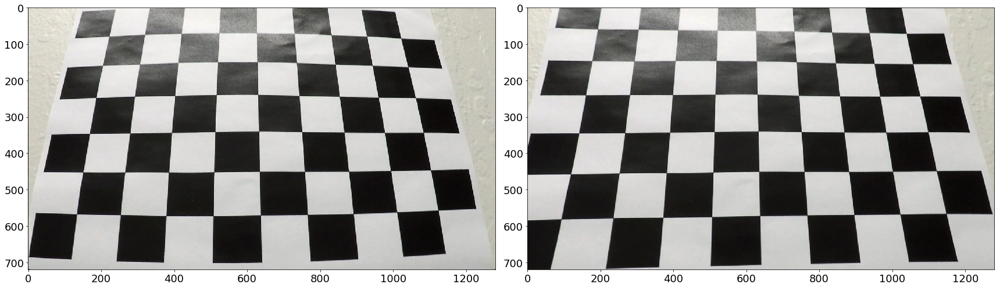

In [3]:
test_image = './camera_cal/calibration3.jpg'

raw_img = cv2.imread(test_image)
retval, undst_img, mtx, dist = calUndistort(raw_img, objPoints, imgPoints)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(raw_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/calibration3.png',cv2.cvtColor(raw_img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/calibration3_undst.png',cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB))

### Image undistortion

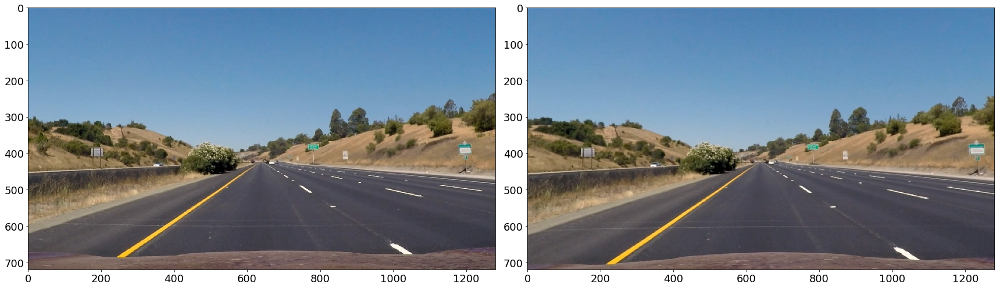

In [4]:
# test_image = './test_images/test5.jpg'
test_image = './test_images/straight_lines1.jpg'

raw_img = cv2.imread(test_image)
retval, undst_img, mtx, dist = calUndistort(raw_img, objPoints, imgPoints)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(raw_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1.png',cv2.cvtColor(raw_img,cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_undst.png',cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB))

### Thresholds

#### X and Y derivatives

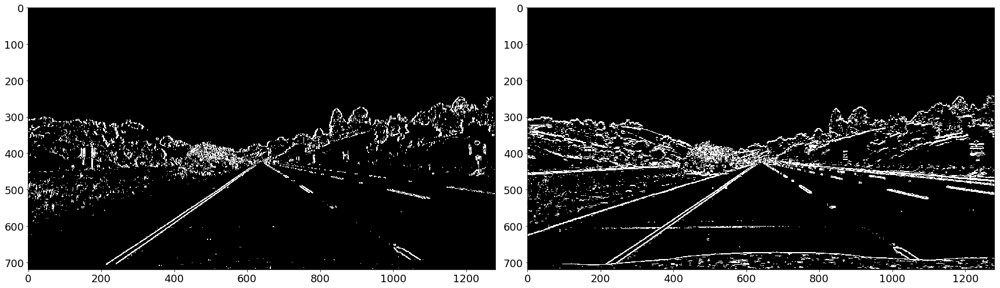

In [5]:
# test the sobel filter
s_thresh = (20, 230)
sobel_kernel = 9

sobelx_img, sobelx = sobel_thresh(BGR2GRAY(undst_img), 'x', s_thresh, sobel_kernel)
sobely_img, sobely = sobel_thresh(BGR2GRAY(undst_img), 'y', s_thresh, sobel_kernel)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(sobelx_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_sobelx.png',sobelx_img, cmap=plt.cm.gray)
plt.subplot(1,2,2)
plt.imshow(sobely_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_sobely.png',sobely_img, cmap=plt.cm.gray)

#### Magnitudes of gradients

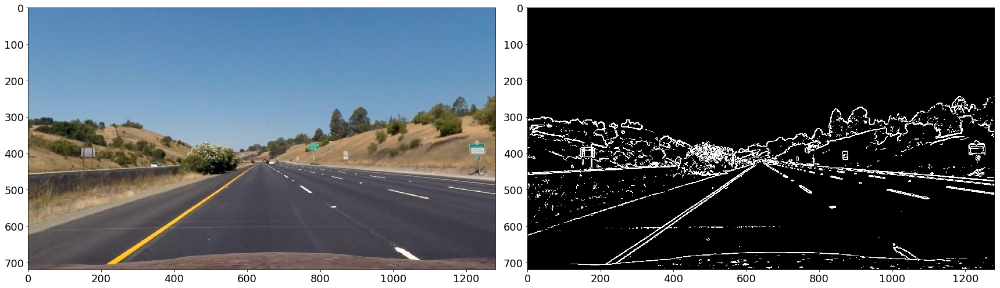

In [6]:
# test the gradient magnitude threshold
sobel_kernel = 9
m_thresh = (30,220)
mag_grad_img = sobel_mag_thresh(sobelx, sobely, m_thresh)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(mag_grad_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_mag_grad_img.png',mag_grad_img, cmap=plt.cm.gray)

#### Directions of gradients

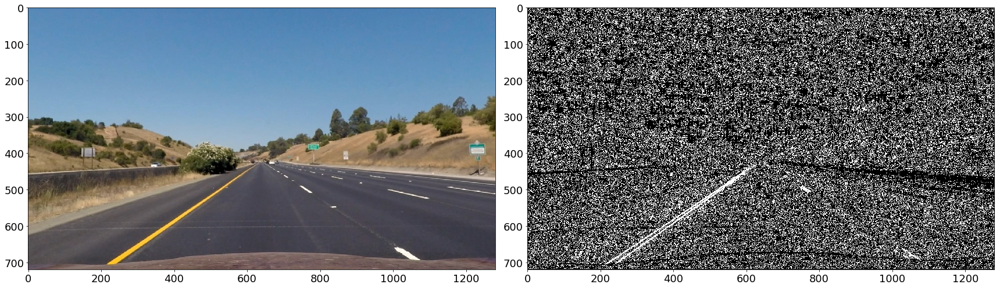

In [7]:
# test directions of gradients
d_thresh = (0.7,1.2)
dir_grad_img = dir_thresh(sobelx, sobely, d_thresh)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(dir_grad_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_dir_grad_img.png',dir_grad_img, cmap=plt.cm.gray)

#### Combing thresholds based on gradients

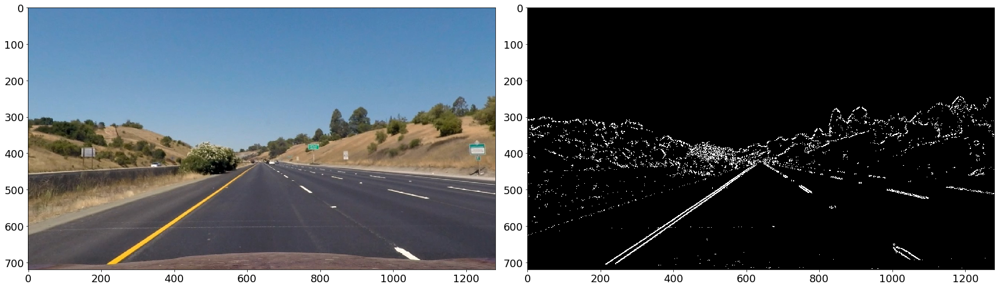

In [8]:
# test combined thresholds based on gradients
sobel_kernel = 9
s_thresh = (20,230)
m_thresh = (30,220)
d_thresh = (0.7,1.2)
comb_grad_img = grad_thresh(undst_img, s_thresh, m_thresh, d_thresh, sobel_kernel)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(comb_grad_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_comb_grad_img.png',comb_grad_img, cmap=plt.cm.gray)

#### HLS threshold on S channel

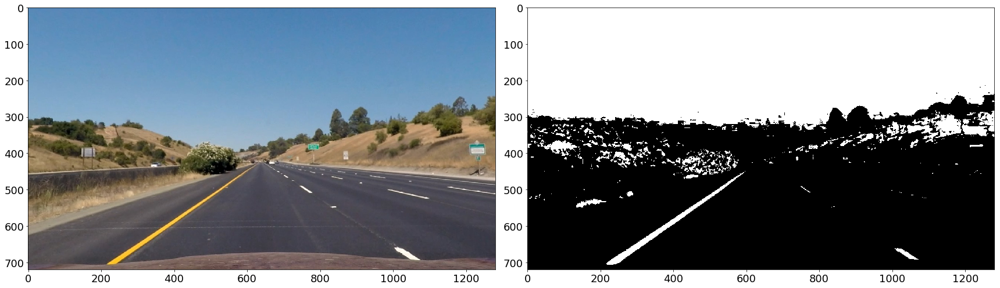

In [9]:
# test combined thresholds based on gradients
cs_thresh = (90, 255)
ch_thresh = (0, 255)

hls_s_img = hls_thresh(undst_img, cs_thresh, ch_thresh)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(hls_s_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_hls_s_img.png',hls_s_img, cmap=plt.cm.gray)

### HLS threshold on H channel

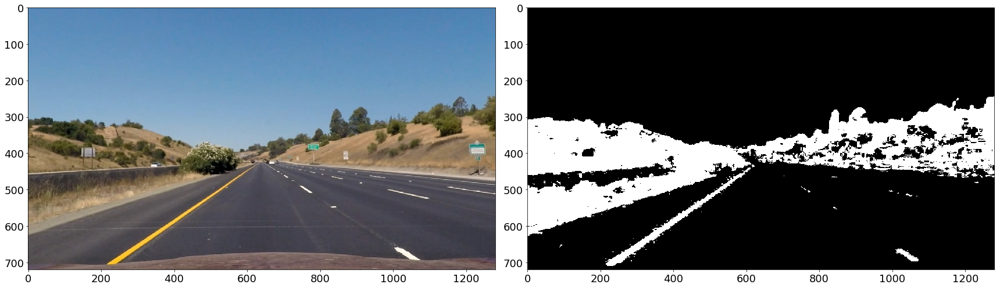

In [10]:
# test combined thresholds based on gradients
cs_thresh = (0, 255)
ch_thresh = (15, 100)

hls_h_img = hls_thresh(undst_img, cs_thresh, ch_thresh)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(hls_h_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_hls_h_img.png',hls_h_img, cmap=plt.cm.gray)

#### Combine gradient-based and color-based thresholds

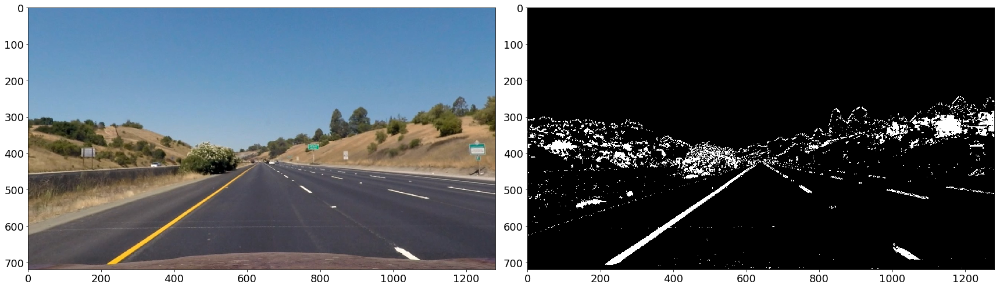

In [11]:
# test combined thresholds based on gradients
sobel_kernel = 9
s_thresh = (20,230)
m_thresh = (30,220)
d_thresh = (0.7,1.2)
cs_thresh = (90, 255)
ch_thresh = (15, 100)

comb_img =  img_thresh(undst_img, s_thresh, m_thresh, d_thresh, cs_thresh, ch_thresh, sobel_kernel)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
plt.imshow(comb_img, cmap = 'gray');
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.imsave('./output_images/straight_lines1_comb_img.png',comb_img, cmap=plt.cm.gray)

### Perspective transform

The chosen points in (x,y) are

| Source     | Target      |
| ---------- | ----------- |
| (213,700)  | (300,700)   |
| (592,450)  | (300,20)    |
| (687,450)  | (1000,20)   |
| (1090,700) | (1000,700)  |

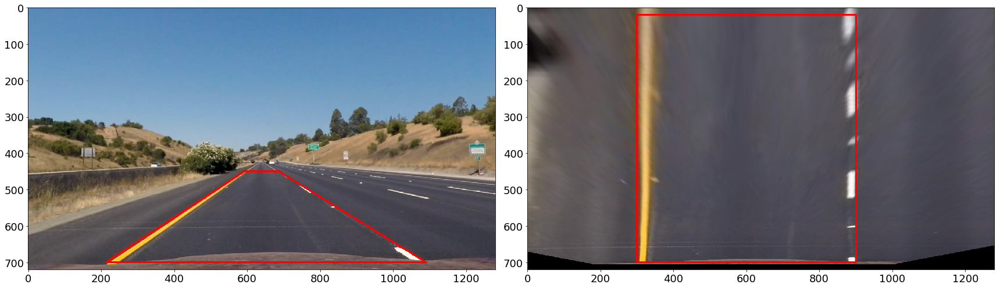

In [12]:

# srcPoints = np.array([[213,700],[592,450],[687,450],[1090,700]])
# tgtPoints = np.array([[215,700],[215,20],[1090,20],[1090,700]])


srcPoints = np.array([[213,700],[592,450],[687,450],[1090,700]])
tgtPoints = np.array([[300,700],[300,20],[900,20],[900,700]])

warped_img, M, Minv = img_warper(undst_img, srcPoints, tgtPoints)

plt.figure(figsize = (24, 24))
plt.subplot(1,2,1)
polyline_undst_img = undst_img.copy()
cv2.polylines(polyline_undst_img, [srcPoints.reshape(-1,1,2)], True, color=(0,0,255),thickness = 3)
plt.imshow(cv2.cvtColor(polyline_undst_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.subplot(1,2,2)
polyline_warped_img = warped_img.copy()
cv2.polylines(polyline_warped_img, [tgtPoints.reshape(-1,1,2)], isClosed=True, thickness=3, color=(0,0,255))
plt.imshow(cv2.cvtColor(polyline_warped_img,cv2.COLOR_BGR2RGB));
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()

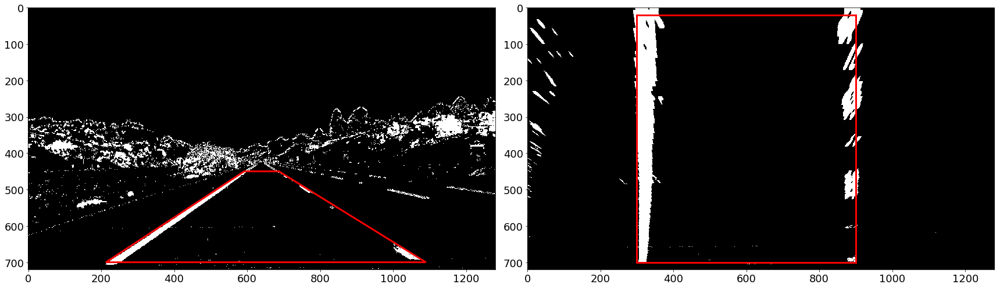

In [13]:

# warped_comb_img, M, Minv = img_warper(img_roi(comb_img,roiPoints), np.float32(srcPoints), np.float32(tgtPoints))
warped_comb_img, M, Minv = img_warper(comb_img, np.float32(srcPoints), np.float32(tgtPoints))

fig = plt.figure(figsize = (24, 8))
plt.subplot(1,2,1)
plt.imshow(comb_img,cmap='gray');
plt.fill(srcPoints[:,0],srcPoints[:,1], edgecolor='r', fill=False, linewidth = 3)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
# plt.imsave('./output_images/straight_lines1_comb_img_sq.png',comb_img, cmap=plt.cm.gray)
plt.subplot(1,2,2)
plt.imshow(warped_comb_img,cmap='gray');
plt.fill(tgtPoints[:,0],tgtPoints[:,1], edgecolor='r', fill=False, linewidth = 3)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
# plt.imsave('./output_images/straight_lines1_warped_comb_img_sq.png',warped_comb_img, cmap=plt.cm.gray)
fig.savefig('./output_images/straight_lines1_warped_comb_img_sq.png')

#### Test the combined filter on all testing images

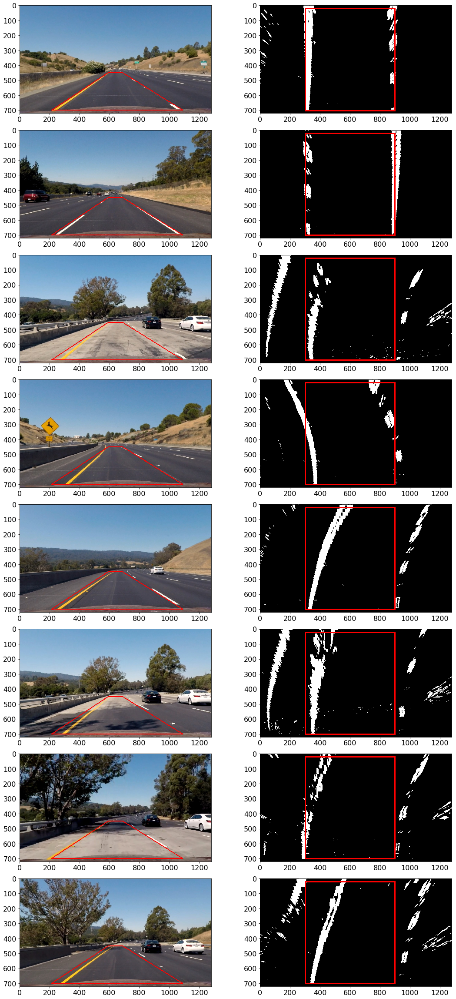

In [14]:
files = glob.glob('./test_images/*.jpg')

n_files = len(files)
plt.figure(figsize = (24, 32))

for i,file in enumerate(files):
    
    raw_img_i =  cv2.imread(file)
    retval, undst_img_i, _, _ = calUndistort(raw_img_i, objPoints, imgPoints)
    
    warped_img_i, _, _ = img_warper(undst_img_i, srcPoints, tgtPoints)

    
    comb_img_i = img_thresh(undst_img_i, s_thresh, m_thresh, d_thresh, cs_thresh, sobel_kernel = 3)
#     warped_comb_img_i, _, _ = img_warper(img_roi(comb_img_i,roiPoints), np.float32(srcPoints), np.float32(tgtPoints))
    warped_comb_img_i, _, _ = img_warper(comb_img_i, np.float32(srcPoints), np.float32(tgtPoints))
    
    plt.subplot(8,3,i*3+1)
    polyline_undst_img_i = undst_img_i.copy()
    cv2.polylines(polyline_undst_img_i, [srcPoints.reshape(-1,1,2)], True, color=(0,0,255), thickness = 3)
    plt.imshow(cv2.cvtColor(polyline_undst_img_i,cv2.COLOR_BGR2RGB));
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.tight_layout()
    
#     plt.subplot(n_files,3,i*3+2)
#     polyline_warped_img_i = warped_img_i.copy()
#     cv2.polylines(polyline_warped_img_i, [tgtPoints.reshape(-1,1,2)], True, color=(0,0,255), thickness=3)
#     plt.imshow(cv2.cvtColor(polyline_warped_img_i,cv2.COLOR_BGR2RGB));
#     plt.xticks(fontsize=18)
#     plt.yticks(fontsize=18)
#     plt.tight_layout()

    plt.subplot(8,3,i*3+2)
    plt.imshow(warped_comb_img_i,cmap='gray');
    plt.fill(tgtPoints[:,0],tgtPoints[:,1], edgecolor='r', fill=False, linewidth = 3)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.tight_layout()

### Finding lane lines & curvatures

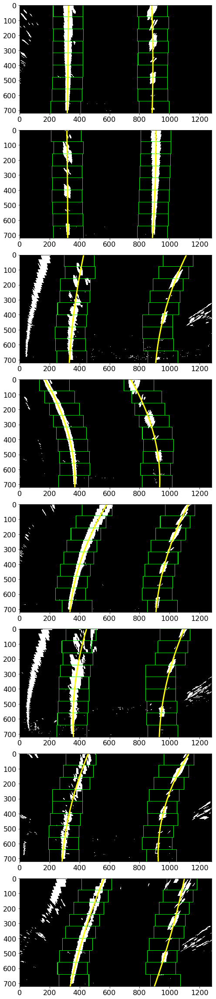

In [15]:
files = glob.glob('./test_images/*.jpg')
# window settings
nwindows = 9
margin = 100
minpix = 50
ym_per_pix = 30.0/720.0
xm_per_pix = 3.7/600.0

n_files = len(files)
fig = plt.figure(figsize = (8, 32))

for i,file in enumerate(files):
    
    raw_img_i =  cv2.imread(file)
    retval, undst_img_i, _, _ = calUndistort(raw_img_i, objPoints, imgPoints)
    
    warped_img_i, _, _ = img_warper(undst_img_i, srcPoints, tgtPoints)

    
    comb_img_i = img_thresh(undst_img_i, s_thresh, m_thresh, d_thresh, cs_thresh, sobel_kernel = 3)
    warped_comb_img_i, _, _ = img_warper(comb_img_i, np.float32(srcPoints), np.float32(tgtPoints))
    lanes_ii,left_fit,right_fit = findLines(warped_comb_img_i, nwindows, margin, minpix)
    lanes_i = findLines_poly(warped_comb_img_i, left_fit, right_fit, margin)
    ploty, left_fitx, right_fitx, left_curverad, right_curverad, y_eval,left_fit_cr,right_fit_cr = laneFit(
        lanes_i[2], lanes_i[3], lanes_i[0], ym_per_pix, xm_per_pix)
    
#     plt.subplot(8,3,i*3+1)
#     plt.imshow(cv2.cvtColor(warped_img_i,cv2.COLOR_BGR2RGB));
#     plt.xticks(fontsize=16)
#     plt.yticks(fontsize=16)
#     plt.tight_layout()
    
    plt.subplot(8,1,i+1)
    plt.imshow(cv2.cvtColor(lanes_ii,cv2.COLOR_BGR2RGB));
    plt.plot(left_fitx, ploty, color='yellow', linewidth = 3)
    plt.plot(right_fitx, ploty, color='yellow', linewidth = 3)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
#     plt.title('Left CurveRad: {:5.2f} m, Right CurveRad: {:5.2f} m'.format(left_curverad,right_curverad))
#     print(y_eval,left_fit_cr,right_fit_cr)
    plt.tight_layout()
fig.savefig('./output_images/test_img_warped_comb_img_sq.png')

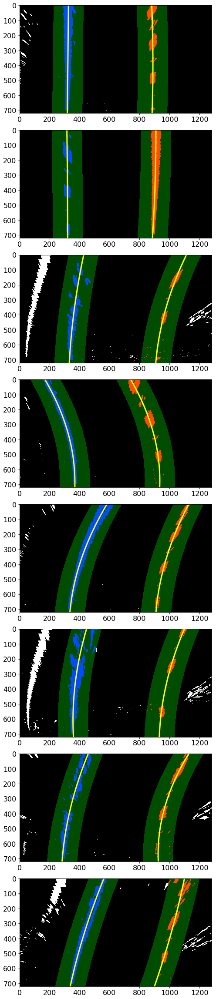

In [16]:
files = glob.glob('./test_images/*.jpg')
# window settings
nwindows = 9
margin = 100
minpix = 50
ym_per_pix = 30.0/720.0
xm_per_pix = 3.7/600.0

n_files = len(files)
fig = plt.figure(figsize = (8, 32))

for i,file in enumerate(files):
    
    raw_img_i =  cv2.imread(file)
    retval, undst_img_i, _, _ = calUndistort(raw_img_i, objPoints, imgPoints)
    
    warped_img_i, _, _ = img_warper(undst_img_i, srcPoints, tgtPoints)

    
    comb_img_i = img_thresh(undst_img_i, s_thresh, m_thresh, d_thresh, cs_thresh, sobel_kernel = 3)
    warped_comb_img_i, _, _ = img_warper(comb_img_i, np.float32(srcPoints), np.float32(tgtPoints))
    lanes_ii,left_fit,right_fit = findLines(warped_comb_img_i, nwindows, margin, minpix)
    lanes_i = findLines_poly(warped_comb_img_i, left_fit, right_fit, margin)
    ploty, left_fitx, right_fitx, left_curverad, right_curverad, y_eval,left_fit_cr,right_fit_cr = laneFit(
        lanes_i[2], lanes_i[3], lanes_i[0], ym_per_pix, xm_per_pix)
    
#     plt.subplot(8,3,i*3+1)
#     plt.imshow(cv2.cvtColor(warped_img_i,cv2.COLOR_BGR2RGB));
#     plt.xticks(fontsize=16)
#     plt.yticks(fontsize=16)
#     plt.tight_layout()
    
    plt.subplot(8,1,i+1)
    plt.imshow(cv2.cvtColor(lanes_i[1],cv2.COLOR_BGR2RGB));
    plt.plot(left_fitx, ploty, color='yellow', linewidth = 3)
    plt.plot(right_fitx, ploty, color='yellow', linewidth = 3)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
#     plt.title('Left CurveRad: {:5.2f} m, Right CurveRad: {:5.2f} m'.format(left_curverad,right_curverad))
#     print(y_eval,left_fit_cr,right_fit_cr)
    plt.tight_layout()
fig.savefig('./output_images/test_img_warped_comb_img_sq_2nd.png')

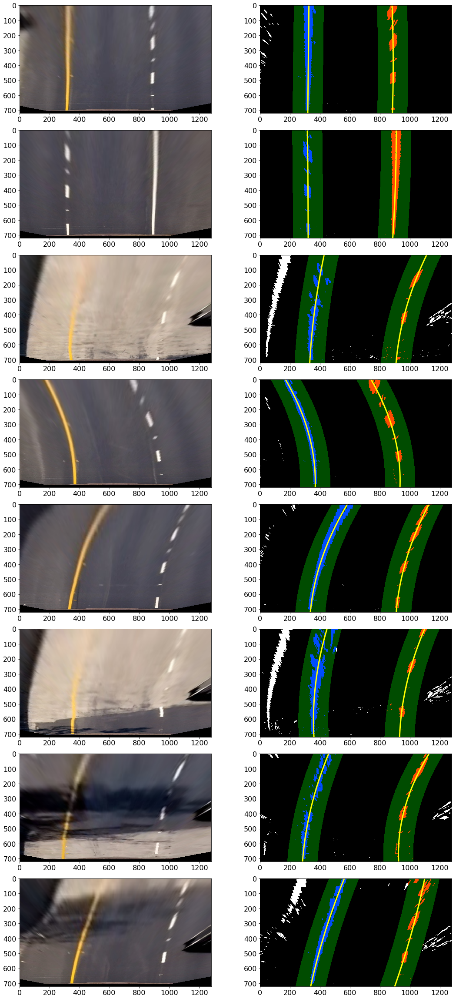

In [17]:
files = glob.glob('./test_images/*.jpg')
# window settings
nwindows = 9
margin = 100
minpix = 50
ym_per_pix = 30.0/720.0
xm_per_pix = 3.7/600.0

n_files = len(files)
plt.figure(figsize = (24, 32))

for i,file in enumerate(files):
    
    raw_img_i =  cv2.imread(file)
    retval, undst_img_i, _, _ = calUndistort(raw_img_i, objPoints, imgPoints)
    
    warped_img_i, _, _ = img_warper(undst_img_i, srcPoints, tgtPoints)

    
    comb_img_i = img_thresh(undst_img_i, s_thresh, m_thresh, d_thresh, cs_thresh, sobel_kernel = 3)
    warped_comb_img_i, _, _ = img_warper(comb_img_i, np.float32(srcPoints), np.float32(tgtPoints))
    _,left_fit,right_fit = findLines(warped_comb_img_i, nwindows, margin, minpix)
    lanes_i = findLines_poly(warped_comb_img_i, left_fit, right_fit, margin)
    ploty, left_fitx, right_fitx, left_curverad, right_curverad, y_eval,left_fit_cr,right_fit_cr = laneFit(
        lanes_i[2], lanes_i[3], lanes_i[0], ym_per_pix, xm_per_pix)
    
    plt.subplot(8,3,i*3+1)
    plt.imshow(cv2.cvtColor(warped_img_i,cv2.COLOR_BGR2RGB));
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.tight_layout()
    
    plt.subplot(8,3,i*3+2)
    plt.imshow(cv2.cvtColor(lanes_i[1],cv2.COLOR_BGR2RGB));
    plt.plot(left_fitx, ploty, color='yellow', linewidth = 3)
    plt.plot(right_fitx, ploty, color='yellow', linewidth = 3)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
#     plt.title('Left CurveRad: {:5.2f} m, Right CurveRad: {:5.2f} m'.format(left_curverad,right_curverad))
#     print(y_eval,left_fit_cr,right_fit_cr)
    plt.tight_layout()

### Draw identified lanes on the original image

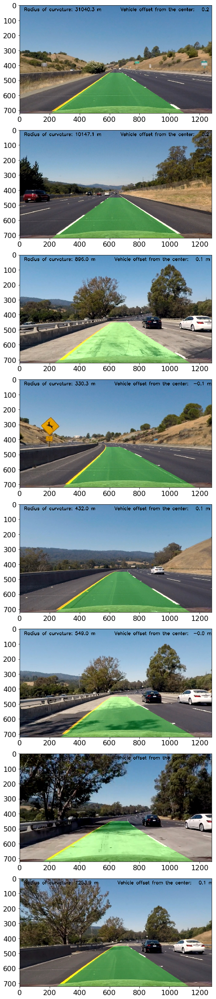

In [24]:
files = glob.glob('./test_images/*.jpg')
# window settings
nwindows = 9
margin = 100
minpix = 50
ym_per_pix = 30.0/720.0
xm_per_pix = 3.7/600.0

n_files = len(files)
fig = plt.figure(figsize = (8, 32))

for i,file in enumerate(files):
    
    raw_img_i =  cv2.imread(file)
    retval, undst_img_i, mtx, dist = calUndistort(raw_img_i, objPoints, imgPoints)
    
    warped_img_i, M, Minv = img_warper(undst_img_i, srcPoints, tgtPoints)

    
    comb_img_i = img_thresh(undst_img_i, s_thresh, m_thresh, d_thresh, cs_thresh, sobel_kernel = 3)
    warped_comb_img_i, _, _ = img_warper(comb_img_i, np.float32(srcPoints), np.float32(tgtPoints))
    _,left_fit,right_fit = findLines(warped_comb_img_i, nwindows, margin, minpix)
    lanes_i = findLines_poly(warped_comb_img_i, left_fit, right_fit, margin)
    ploty, left_fitx, right_fitx, left_curverad, right_curverad, y_eval,left_fit_cr,right_fit_cr = laneFit(
        lanes_i[2], lanes_i[3], lanes_i[0], ym_per_pix, xm_per_pix)
    undst_lane_img_i = invLanes(undst_img_i, warped_comb_img_i, ploty, left_fitx, right_fitx, Minv)
    
        # calculate car offset
    offset = vehOffset(undst_lane_img_i, left_fit, right_fit, xm_per_pix)
    
    # add curvature radius on to the image
    img_i = addText(undst_lane_img_i, left_curverad, right_curverad, offset)
    
    plt.subplot(8,1,i+1)
    plt.imshow(cv2.cvtColor(img_i,cv2.COLOR_BGR2RGB));
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
#     plt.title('Left CurveRad: {:5.2f} m, Right CurveRad: {:5.2f} m'.format(left_curverad,right_curverad))
#     print(y_eval,left_fit_cr,right_fit_cr)
    plt.tight_layout()
fig.savefig('./output_images/plot_back_images.png')

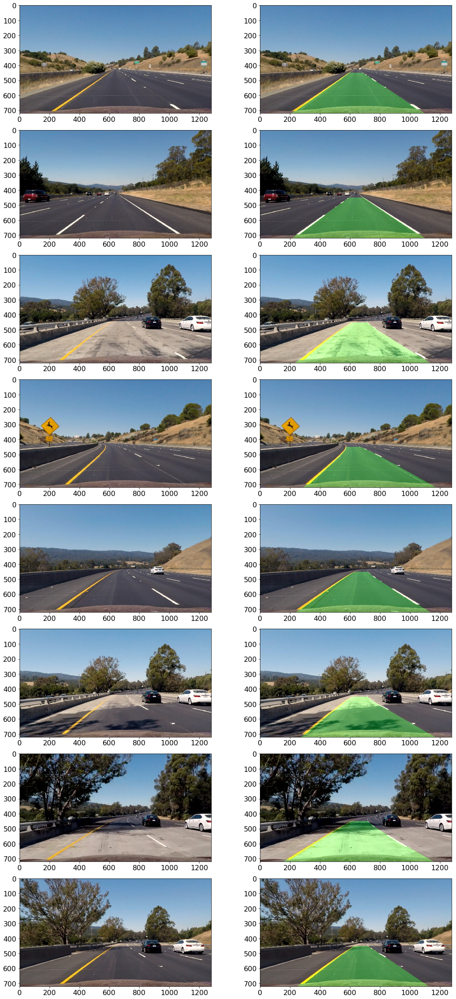

In [42]:
files = glob.glob('./test_images/*.jpg')
# window settings
nwindows = 9
margin = 100
minpix = 50
ym_per_pix = 30.0/720.0
xm_per_pix = 3.7/600.0

n_files = len(files)
plt.figure(figsize = (24, 32))

for i,file in enumerate(files):
    
    raw_img_i =  cv2.imread(file)
    retval, undst_img_i, mtx, dist = calUndistort(raw_img_i, objPoints, imgPoints)
    
    warped_img_i, M, Minv = img_warper(undst_img_i, srcPoints, tgtPoints)

    
    comb_img_i = img_thresh(undst_img_i, s_thresh, m_thresh, d_thresh, cs_thresh, sobel_kernel = 3)
    warped_comb_img_i, _, _ = img_warper(comb_img_i, np.float32(srcPoints), np.float32(tgtPoints))
    _,left_fit,right_fit = findLines(warped_comb_img_i, nwindows, margin, minpix)
    lanes_i = findLines_poly(warped_comb_img_i, left_fit, right_fit, margin)
    ploty, left_fitx, right_fitx, left_curverad, right_curverad, y_eval,left_fit_cr,right_fit_cr = laneFit(
        lanes_i[2], lanes_i[3], lanes_i[0], ym_per_pix, xm_per_pix)
    undst_lane_img_i = invLanes(undst_img_i, warped_comb_img_i, ploty, left_fitx, right_fitx, Minv)
    
    
    plt.subplot(8,3,i*3+1)
    plt.imshow(cv2.cvtColor(undst_img_i,cv2.COLOR_BGR2RGB));
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.tight_layout()
    
    plt.subplot(8,3,i*3+2)
    plt.imshow(cv2.cvtColor(undst_lane_img_i,cv2.COLOR_BGR2RGB));
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
#     plt.title('Left CurveRad: {:5.2f} m, Right CurveRad: {:5.2f} m'.format(left_curverad,right_curverad))
#     print(y_eval,left_fit_cr,right_fit_cr)
    plt.tight_layout()